In [6]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import matplotlib.image as mpimg
from PIL import Image, ImageDraw
from scipy import misc
import glob
import imageio
import os

In [7]:
PATH = './figures/temp/cluster_'
tsne = Image.open('./figures/interaction_tsne_numbered.png')
images = [Image.open(PATH+ str(i)+'.png') for i in range(1,13)]

In [8]:
def get_concat_v(im1, im2):
    dst = Image.new('RGB', (im1.width, im1.height + im2.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (0, im1.height))
    return dst

def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im2.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width,0))
    return dst

def var_get_concat_h(im1, im2):
    dst = Image.new('RGB', (2*im2.width, im2.height))
    dst.paste(im1.resize((im2.width, im2.height)), (0, 0))
    dst.paste(im2, (im2.width,0))
    return dst

def var_get_concat_v(im1, im2):
    dst = Image.new('RGB', (im2.width, 3* im2.height))
    dst.paste(im1.resize((im2.width, 2*im2.height)), (0, 0))
    dst.paste(im2, (0,2*im2.height))
    return dst

In [9]:
def get_rows(images, nrows, ncols):
    rows = []
    for i in range(nrows):
        im1 = images[i*ncols]
        for j in range(1,ncols):
            im1 = get_concat_h(im1, images[j+i*ncols])
        rows.append(im1)
    return rows
            

In [10]:
def get_cols(row_list, nrows, ncols):
    row1 = row_list[0]
    for i in range(1,nrows):
        row1 = get_concat_v(row1, row_list[i])
    return row1

In [11]:
def get_image(nrows, ncols):
    row_list = get_rows(images[:10], nrows, ncols)
    end = get_cols(row_list,nrows,ncols)
    return end

def get_image_tsne():
    
    second_col = get_concat_v(images[0], images[2])
    third_col = get_concat_v(images[1], images[3])
    last_col = get_concat_h(second_col, third_col)
    second_row = get_concat_h(get_concat_h(get_concat_h(images[4], images[5]), images[6]), images[7])
    first_row = var_get_concat_h(tsne, last_col)
    clusters = get_concat_v(first_row, second_row)
    
    return clusters

In [13]:
#len(images)
img1 = get_image(nrows=5, ncols=2)

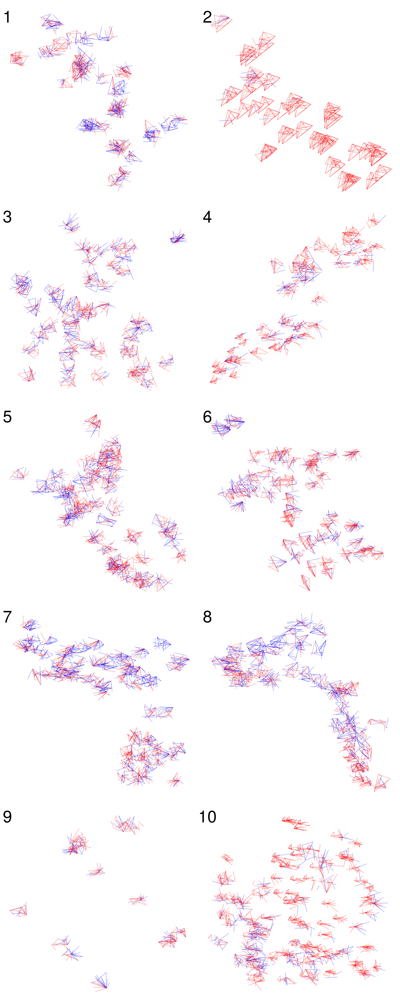

In [14]:
img1

In [15]:
img1.save("./figures/supp_3_Revision.pdf", format="pdf")

In [16]:
###

In [17]:
# average_plot

In [18]:
PATH = './figures/temp/average_ID_'
#tsne = Image.open('/mnt/scratch2/mlprot/mlprot_220920/plots_statistics/figures/interaction_tsne_numbered.png')
images = [Image.open(PATH+ str(i)+'.png') for i in range(1,13)]


In [19]:
def get_concat_v(im1, im2):
    dst = Image.new('RGB', (im1.width, im1.height + im2.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (0, im1.height))
    return dst

def get_concat_h(im1, im2):
    dst = Image.new('RGB', (im1.width + im2.width, im2.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width,0))
    return dst

In [20]:
def get_rows(images, nrows, ncols):
    rows = []
    for i in range(nrows):
        im1 = images[i*ncols]
        for j in range(1,ncols):
            im1 = get_concat_h(im1, images[j+i*ncols])
        rows.append(im1)
    return rows

In [21]:
def get_cols(row_list, nrows, ncols):
    row1 = row_list[0]
    for i in range(1,nrows):
        row1 = get_concat_v(row1, row_list[i])
    return row1

In [22]:
def get_image(nrows, ncols):
    row_list = get_rows(images[:11], nrows, ncols)
    end = get_cols(row_list,nrows,ncols)
    return end


In [23]:
img2 = get_image(5,2)


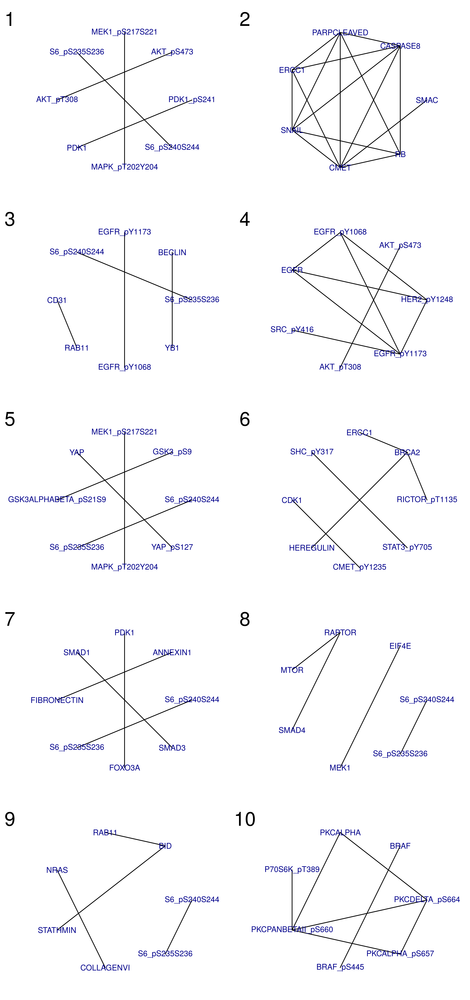

In [24]:
img2

In [25]:
img2.save("./figures/supp_4_Revision.pdf", format="pdf")

In [26]:
combined_image = get_concat_h(img1,img2)

In [27]:
combined_image

In [28]:
combined_image.save("./figures/supp_4_Revision_combined.pdf", format="pdf")